In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
import matplotlib.pyplot as plt
import warnings

# plt.style.use('seaborn')
# plt.style.use('seaborn-colorblind') #alternative
plt.rcParams['figure.figsize'] = [16, 9]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

# Technical Analysis in Python

## Creating a Candlestick Chart

### Getting ready

1. Import the libraries:

In [3]:
import pandas as pd 
import yfinance as yf

2. Download the adjusted prices from Yahoo Finance:

In [4]:
df_twtr = yf.download('TWTR', 
                       start='2018-01-01', 
                       end='2018-12-31',
                       progress=False,
                       auto_adjust=True)

### How to do it...

1. Import the libraries:

In [5]:
import cufflinks as cf
from plotly.offline import iplot, init_notebook_mode

init_notebook_mode()

2. Create the candlestick chart using Twitter's stock prices:

In [6]:
qf = cf.QuantFig(df_twtr, title='Twitter Stock Price Movement 2018', 
                 legend='top', name='TWTR')

3. Add volume and moving averages to the figure:

In [7]:
qf.add_volume()
qf.add_sma(periods=20, column='Close', color='red')
qf.add_ema(periods=20, color='green') 

4. Display the plot:

In [8]:
qf.iplot()

## Backtesting a Strategy Based on Simple Moving Average

### How to do it...

#### Signal 

1. Import the libraries:

In [3]:
from datetime import datetime
import backtrader as bt

2. Define a class representing the trading strategy:

In [4]:
class SmaSignal(bt.Signal):
    params = (('period', 20), )
    
    def __init__(self):
        self.lines.signal = self.data - bt.ind.SMA(period=self.p.period)

3. Download data from Yahoo Finance:

In [5]:
data = bt.feeds.YahooFinanceData(dataname='AAPL', 
                                 fromdate=datetime(2018, 1, 1),
                                 todate=datetime(2018, 12, 31))

4. Set up the backtest:

In [6]:
cerebro = bt.Cerebro(stdstats = False)

cerebro.adddata(data)
cerebro.broker.setcash(1000.0)
cerebro.add_signal(bt.SIGNAL_LONG, SmaSignal)
cerebro.addobserver(bt.observers.BuySell)
cerebro.addobserver(bt.observers.Value)

5. Run the backtest:

In [7]:
print(f'Starting Portfolio Value: {cerebro.broker.getvalue():.2f}')
x = cerebro.run()
print(f'Final Portfolio Value: {cerebro.broker.getvalue():.2f}')

Starting Portfolio Value: 1000.00
Final Portfolio Value: 1011.56


6. Plot the results:

In [8]:
cerebro.plot(iplot=True, volume=False)

<IPython.core.display.Javascript object>

[[<Figure size 4800x2700 with 3 Axes>]]

#### Strategy

1. The template of the strategy looks like:

In [9]:
class SmaStrategy(bt.Strategy):
    params = (('ma_period', 20), )

    def __init__(self):
        # keep track of close price in the series
        self.data_close = self.datas[0].close

        # keep track of pending orders/buy price/buy commission
        self.order = None
        self.price = None
        self.comm = None

        # add a simple moving average indicator
        self.sma = bt.ind.SMA(self.datas[0], period=self.params.ma_period)
        
    def log(self, txt):
        dt = self.datas[0].datetime.date(0).isoformat()
        print(f'{dt}, {txt}')

    def notify_order(self, order):
        if order.status in [order.Submitted, order.Accepted]:
            # order already submitted/accepted - no action required
            return

        # report executed order
        if order.status in [order.Completed]:
            if order.isbuy():
                self.log(f'BUY EXECUTED --- Price: {order.executed.price:.2f}, Cost: {order.executed.value:.2f}, Commission: {order.executed.comm:.2f}')
                self.price = order.executed.price
                self.comm = order.executed.comm
            else:
                self.log(f'SELL EXECUTED --- Price: {order.executed.price:.2f}, Cost: {order.executed.value:.2f}, Commission: {order.executed.comm:.2f}')

        # report failed order
        elif order.status in [order.Canceled, order.Margin, order.Rejected]:
            self.log('Order Failed')

        # set no pending order
        self.order = None

    def notify_trade(self, trade):
        if not trade.isclosed:
            return

        self.log(f'OPERATION RESULT --- Gross: {trade.pnl:.2f}, Net: {trade.pnlcomm:.2f}')

    def next(self):
        # do nothing if an order is pending
        if self.order:
            return

        # check if there is already a position
        if not self.position:
            # buy condition
            if self.data_close[0] > self.sma[0]:
                self.log(f'BUY CREATED --- Price: {self.data_close[0]:.2f}')
                self.order = self.buy()
        else:
            # sell condition
            if self.data_close[0] < self.sma[0]:            
                self.log(f'SELL CREATED --- Price: {self.data_close[0]:.2f}')
                self.order = self.sell()

2. Set up the backtest:

In [10]:
cerebro = bt.Cerebro(stdstats = False)

cerebro.adddata(data)
cerebro.broker.setcash(1000.0)
cerebro.addstrategy(SmaStrategy)
cerebro.addobserver(bt.observers.BuySell)
cerebro.addobserver(bt.observers.Value)

3. Run the backtest:

In [11]:
print(f'Starting Portfolio Value: {cerebro.broker.getvalue():.2f}')
cerebro.run()
print(f'Final Portfolio Value: {cerebro.broker.getvalue():.2f}')

Starting Portfolio Value: 1000.00
2018-02-14, BUY CREATED --- Price: 163.12
2018-02-15, BUY EXECUTED --- Price: 165.47, Cost: 165.47, Commission: 0.00
2018-03-19, SELL CREATED --- Price: 170.84
2018-03-20, SELL EXECUTED --- Price: 170.79, Cost: 165.47, Commission: 0.00
2018-03-20, OPERATION RESULT --- Gross: 5.32, Net: 5.32
2018-04-10, BUY CREATED --- Price: 168.85
2018-04-11, BUY EXECUTED --- Price: 167.85, Cost: 167.85, Commission: 0.00
2018-04-20, SELL CREATED --- Price: 161.51
2018-04-23, SELL EXECUTED --- Price: 162.59, Cost: 167.85, Commission: 0.00
2018-04-23, OPERATION RESULT --- Gross: -5.26, Net: -5.26
2018-05-02, BUY CREATED --- Price: 172.08
2018-05-03, BUY EXECUTED --- Price: 171.41, Cost: 171.41, Commission: 0.00
2018-06-15, SELL CREATED --- Price: 184.75
2018-06-18, SELL EXECUTED --- Price: 183.81, Cost: 171.41, Commission: 0.00
2018-06-18, OPERATION RESULT --- Gross: 12.40, Net: 12.40
2018-07-06, BUY CREATED --- Price: 183.90
2018-07-09, BUY EXECUTED --- Price: 185.40, 

### There's more

We used the Jupyter magic command `%load` to import the content of the backtrader_sma_strategy_optimization.py file.

In [12]:
# %load backtrader_sma_strategy_optimization.py
from datetime import datetime
import backtrader as bt

# Create a Stratey
class SmaStrategy(bt.Strategy):
    params = (('ma_period', 20),)

    def __init__(self):
        # keep track of close price in the series
        self.data_close = self.datas[0].close

        # keep track of pending orders
        self.order = None

        # add a simple moving average indicator
        self.sma = bt.ind.SMA(self.datas[0], period=self.params.ma_period)

    def log(self, txt):
        '''Logging function'''
        dt = self.datas[0].datetime.date(0).isoformat()
        print(f'{dt}, {txt}')

    def notify_order(self, order):
        # set no pending order
        self.order = None

    def next(self):
        # do nothing if an order is pending
        if self.order:
            return

        # check if there is already a position
        if not self.position:
            # buy condition
            if self.data_close[0] > self.sma[0]:
                self.order = self.buy()
        else:
            # sell condition
            if self.data_close[0] < self.sma[0]:
                self.order = self.sell()

    def stop(self):
        self.log(f'(ma_period = {self.params.ma_period:2d}) --- Terminal Value: {self.broker.getvalue():.2f}')

# download data
data = bt.feeds.YahooFinanceData(dataname='AAPL',
                                 fromdate=datetime(2018, 1, 1),
                                 todate=datetime(2018, 12, 31))

# create a Cerebro entity
cerebro = bt.Cerebro(stdstats = False)

# set up the backtest
cerebro.adddata(data)
cerebro.optstrategy(SmaStrategy, ma_period=range(10, 31))
cerebro.broker.setcash(1000.0)
cerebro.run(maxcpus=4)


2018-12-28, (ma_period = 12) --- Terminal Value: 1005.78
2018-12-28, (ma_period = 13) --- Terminal Value: 992.35
2018-12-28, (ma_period = 11) --- Terminal Value: 1004.32
2018-12-28, (ma_period = 10) --- Terminal Value: 1006.21
2018-12-28, (ma_period = 17) --- Terminal Value: 992.80
2018-12-28, (ma_period = 14) --- Terminal Value: 977.23
2018-12-28, (ma_period = 15) --- Terminal Value: 981.49
2018-12-28, (ma_period = 16) --- Terminal Value: 979.90
2018-12-28, (ma_period = 18) --- Terminal Value: 994.83
2018-12-28, (ma_period = 19) --- Terminal Value: 1005.22
2018-12-28, (ma_period = 20) --- Terminal Value: 1011.56
2018-12-28, (ma_period = 21) --- Terminal Value: 1013.56
2018-12-28, (ma_period = 22) --- Terminal Value: 1021.11
2018-12-28, (ma_period = 23) --- Terminal Value: 1018.59
2018-12-28, (ma_period = 24) --- Terminal Value: 1018.59
2018-12-28, (ma_period = 25) --- Terminal Value: 1018.10
2018-12-28, (ma_period = 26) --- Terminal Value: 1009.30
2018-12-28, (ma_period = 27) --- Term

[[<backtrader.cerebro.OptReturn at 0x13d8f2d68>],

## Calculating Bollinger Bands and testing a buy/sell strategy

1. Import the libraries:

In [12]:
import backtrader as bt
import datetime
import pandas as pd
import matplotlib.pyplot as plt

2. The template of the strategy looks like:

In [13]:
class BBand_Strategy(bt.Strategy):
    params = (('period', 20),
              ('devfactor', 2.0),)

    def __init__(self):
        # keep track of close price in the series
        self.data_close = self.datas[0].close
        self.data_open = self.datas[0].open

        # keep track of pending orders/buy price/buy commission
        self.order = None
        self.price = None
        self.comm = None

        # add Bollinger Bands indicator and track the buy/sell signals
        self.b_band = bt.ind.BollingerBands(self.datas[0], 
                                            period=self.p.period, 
                                            devfactor=self.p.devfactor)
        self.buy_signal = bt.ind.CrossOver(self.datas[0], 
                                           self.b_band.lines.bot)
        self.sell_signal = bt.ind.CrossOver(self.datas[0], 
                                            self.b_band.lines.top)

    def log(self, txt):
        '''Logging function'''
        dt = self.datas[0].datetime.date(0).isoformat()
        print(f'{dt}, {txt}')

    def notify_order(self, order):
        if order.status in [order.Submitted, order.Accepted]:
            # order already submitted/accepted - no action required
            return

        # report executed order
        if order.status in [order.Completed]:
            if order.isbuy():
                self.log(
                    f'BUY EXECUTED --- Price: {order.executed.price:.2f}, Cost: {order.executed.value:.2f}, Commission: {order.executed.comm:.2f}'
                )
                self.price = order.executed.price
                self.comm = order.executed.comm
            else:
                self.log(
                    f'SELL EXECUTED --- Price: {order.executed.price:.2f}, Cost: {order.executed.value:.2f}, Commission: {order.executed.comm:.2f}'
                )

        # report failed order
        elif order.status in [order.Canceled, order.Margin, 
                              order.Rejected]:
            self.log('Order Failed')

        # set no pending order
        self.order = None

    def notify_trade(self, trade):
        if not trade.isclosed:
            return

        self.log(f'OPERATION RESULT --- Gross: {trade.pnl:.2f}, Net: {trade.pnlcomm:.2f}')

    def next_open(self):
        if not self.position:
            if self.buy_signal > 0:
                # calculate the max number of shares ('all-in')
                size = int(self.broker.getcash() / self.datas[0].open)
                # buy order
                self.log(f'BUY CREATED --- Size: {size}, Cash: {self.broker.getcash():.2f}, Open: {self.data_open[0]}, Close: {self.data_close[0]}')
                self.buy(size=size)
        else:
            if self.sell_signal < 0:
                # sell order
                self.log(f'SELL CREATED --- Size: {self.position.size}')
                self.sell(size=self.position.size)

3. Download data:

In [14]:
data = bt.feeds.YahooFinanceData(dataname='MSFT',
                                 fromdate=datetime.datetime(2018, 1, 1),
                                 todate=datetime.datetime(2018, 12, 31))

4. Set up the backtest:

In [15]:
cerebro = bt.Cerebro(stdstats = False, cheat_on_open=True)

cerebro.addstrategy(BBand_Strategy)
cerebro.adddata(data)
cerebro.broker.setcash(10000.0)
cerebro.broker.setcommission(commission=0.001)
cerebro.addobserver(bt.observers.BuySell)
cerebro.addobserver(bt.observers.Value)
cerebro.addanalyzer(bt.analyzers.Returns, _name='returns')
cerebro.addanalyzer(bt.analyzers.TimeReturn, _name='time_return')

5. Run the backtest:

In [16]:
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())
backtest_result = cerebro.run()
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 10000.00
2018-02-12, BUY CREATED --- Size: 116, Cash: 10000.00, Open: 85.96, Close: 86.34
2018-02-12, BUY EXECUTED --- Price: 85.96, Cost: 9971.36, Commission: 9.97
2018-04-19, SELL CREATED --- Size: 116
2018-04-19, SELL EXECUTED --- Price: 93.86, Cost: 9971.36, Commission: 10.89
2018-04-19, OPERATION RESULT --- Gross: 916.40, Net: 895.54
2018-06-29, BUY CREATED --- Size: 112, Cash: 10895.54, Open: 96.7, Close: 96.38
2018-06-29, BUY EXECUTED --- Price: 96.70, Cost: 10830.40, Commission: 10.83
2018-07-17, SELL CREATED --- Size: 112
2018-07-17, SELL EXECUTED --- Price: 102.25, Cost: 10830.40, Commission: 11.45
2018-07-17, OPERATION RESULT --- Gross: 621.60, Net: 599.32
2018-10-15, BUY CREATED --- Size: 107, Cash: 11494.86, Open: 106.86, Close: 105.58
2018-10-15, BUY EXECUTED --- Price: 106.86, Cost: 11434.02, Commission: 11.43
Final Portfolio Value: 10634.91


6. Plot the results:

In [23]:
cerebro.plot(iplot=True, volume=False)

[[<Figure size 864x576 with 4 Axes>]]

7. Run to investigate different returns metrics:

In [8]:
print(backtest_result[0].analyzers.returns.get_analysis())

OrderedDict([('rtot', 0.06155731237239935), ('ravg', 0.00024622924948959743), ('rnorm', 0.06401530037885826), ('rnorm100', 6.401530037885826)])


8. Create a plot of daily portfolio returns:

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

plt.style.use('seaborn')
sns.set_palette("colorblind")
plt.rcParams['figure.figsize'] = [16, 9]
plt.rcParams['figure.dpi'] = 200
warnings.simplefilter(action='ignore', category=FutureWarning)

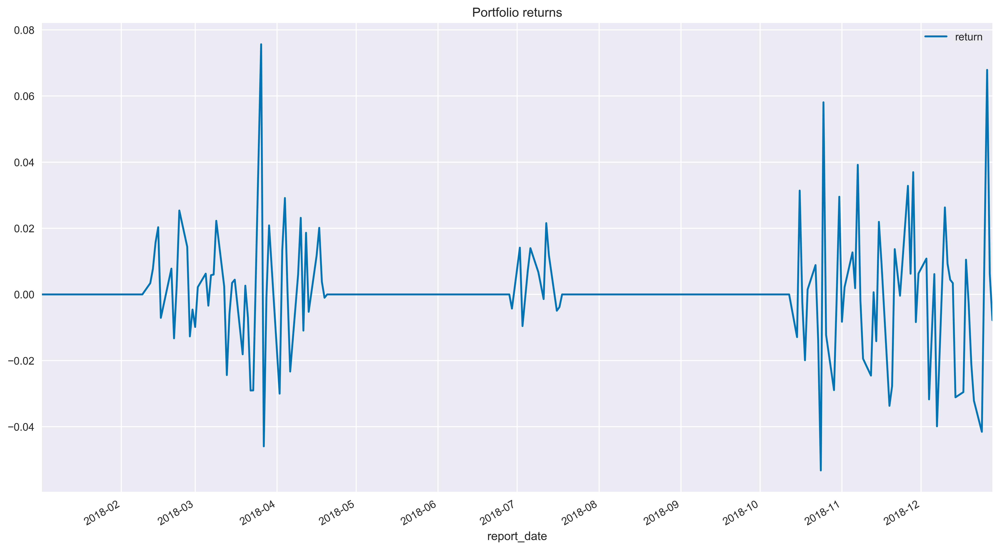

In [16]:
returns_dict = backtest_result[0].analyzers.time_return.get_analysis()
returns_df = pd.DataFrame(list(returns_dict.items()), 
                          columns = ['report_date', 'return']) \
               .set_index('report_date')
returns_df.plot(title='Portfolio returns');

## Calculating RSI and testing a long/short strategy

1. Import the libraries:

In [ ]:
from datetime import datetime
import backtrader as bt

2. Define the signal strategy based on bt.SignalStrategy:

In [ ]:
# create a Stratey
class RsiSignalStrategy(bt.SignalStrategy):
    params = dict(rsi_periods=14, rsi_upper=70, rsi_lower=30, rsi_mid=50)

    def __init__(self):
        
        # add RSI indicator
        rsi = bt.indicators.RSI(period=self.p.rsi_periods,
                                upperband=self.p.rsi_upper,
                                lowerband=self.p.rsi_lower)

        # add RSI from TA-lib just for reference 
        bt.talib.RSI(self.data, plotname='TA_RSI')
    
        # long condition (with exit)
        rsi_signal_long = bt.ind.CrossUp(rsi, self.p.rsi_lower, plot=False)
        self.signal_add(bt.SIGNAL_LONG, rsi_signal_long)
        self.signal_add(bt.SIGNAL_LONGEXIT, -(rsi > self.p.rsi_mid))

        # short condition (with exit)
        rsi_signal_short = -bt.ind.CrossDown(rsi, self.p.rsi_upper, plot=False)
        self.signal_add(bt.SIGNAL_SHORT, rsi_signal_short)
        self.signal_add(bt.SIGNAL_SHORTEXIT, rsi < self.p.rsi_mid)

3. Download data:

In [ ]:
data = bt.feeds.YahooFinanceData(dataname='FB', 
                                 fromdate=datetime(2018, 1, 1),
                                 todate=datetime(2018, 12, 31))

4. Set up and run the backtest:

In [ ]:
cerebro = bt.Cerebro(stdstats = False)

cerebro.addstrategy(RsiSignalStrategy)
cerebro.adddata(data)
cerebro.broker.setcash(1000.0)
cerebro.broker.setcommission(commission=0.001)
cerebro.addobserver(bt.observers.BuySell)
cerebro.addobserver(bt.observers.Value)

cerebro.run()


5. Plot the results:

In [ ]:
cerebro.plot(iplot=True, volume=False)

## Building an Interactive Dashboard for Technical Analysis

### How to do it...

1. Import the libraries:

In [13]:
import ipywidgets as wd
from ipywidgets import interact, interact_manual
import cufflinks as cf
import pandas as pd 
import yfinance as yf
from plotly.offline import iplot, init_notebook_mode

init_notebook_mode()

2. Define the possible values for assets and technical indicators:

In [14]:
stocks = ['TWTR', 'MSFT', 'GOOGL', 'FB', 'TSLA', 'AAPL']
indicators = ['Bollinger Bands', 'MACD', 'RSI']

3. Define a function for creating the interactive plot:

In [15]:
def ta_dashboard(asset, indicator, start_date, end_date, 
                 bb_k, bb_n, macd_fast, macd_slow, macd_signal,
                 rsi_periods, rsi_upper, rsi_lower):
    
    df = yf.download(asset, 
                     start=start_date, 
                     end=end_date,
                     progress=False,
                     auto_adjust=True)

    qf = cf.QuantFig(df, title=f'TA Dashboard - {asset}', 
                     legend='right', name=f'{asset}')
            
    if 'Bollinger Bands' in indicator: 
        qf.add_bollinger_bands(periods=bb_n, 
                               boll_std=bb_k)
    if 'MACD' in indicator: 
        qf.add_macd(fast_period=macd_fast, 
                    slow_period=macd_slow, 
                    signal_period=macd_signal)
    if 'RSI' in indicator: 
        qf.add_rsi(periods=rsi_periods, 
                   rsi_upper=rsi_upper, 
                   rsi_lower=rsi_lower, 
                   showbands=True)

    return qf.iplot()

4. Define the selectors:

In [16]:
stocks_selector = wd.Dropdown(options=stocks, 
                              value=stocks[0], 
                              description='Asset')

indicator_selector = wd.SelectMultiple(description='Indicator',
                                       options=indicators, 
                                       value=[indicators[0]])

start_date_selector = wd.DatePicker(description='Start Date', 
                                    value=pd.to_datetime('2018-01-01'), 
                                    continuous_update=False)

end_date_selector = wd.DatePicker(description='End Date', 
                                  value=pd.to_datetime('2018-12-31'), 
                                  continuous_update=False)

5. Define a label and group the selectors inside a container:

In [17]:
main_selector_label = wd.Label('Main parameters', 
                               layout=wd.Layout(height='45px'))

main_selector_box = wd.VBox(children=[main_selector_label,
                                      stocks_selector,
                                      indicator_selector,
                                      start_date_selector,
                                      end_date_selector])

6. Define the secondary selectors for Bollinger Bands:

In [18]:
bb_label = wd.Label('Bollinger Bands')

n_param = wd.IntSlider(value=20, min=1, max=40, step=1, 
                       description='N:', continuous_update=False)

k_param = wd.FloatSlider(value=2, min=0.5, max=4, step=0.5, 
                         description='k:', continuous_update=False)

bollinger_box = wd.VBox(children=[bb_label, n_param, k_param])

7. Define the secondary selectors for MACD:

In [19]:
macd_label = wd.Label('MACD')

macd_fast = wd.IntSlider(value=12, min=2, max=50, step=1, 
                         description='Fast avg:', 
                         continuous_update=False)

macd_slow = wd.IntSlider(value=26, min=2, max=50, step=1, 
                         description='Slow avg:', 
                         continuous_update=False)

macd_signal = wd.IntSlider(value=9, min=2, max=50, step=1, 
                           description='MACD signal:', 
                           continuous_update=False)

macd_box = wd.VBox(children=[macd_label, macd_fast, 
                             macd_slow, macd_signal])

8. Define the secondary selectors for RSI:

In [20]:
rsi_label = wd.Label('RSI')

rsi_periods = wd.IntSlider(value=14, min=2, max=50, step=1, 
                           description='RSI periods:', 
                           continuous_update=False)

rsi_upper = wd.IntSlider(value=70, min=1, max=100, step=1, 
                         description='Upper Thr:', 
                         continuous_update=False)

rsi_lower = wd.IntSlider(value=30, min=1, max=100, step=1, 
                         description='Lower Thr:', 
                         continuous_update=False)

rsi_box = wd.VBox(children=[rsi_label, rsi_periods, 
                            rsi_upper, rsi_lower])

9. Create the labels and group the selectors into containers:

In [21]:
sec_selector_label = wd.Label('Secondary parameters', 
                                    layout=wd.Layout(height='45px'))
blank_label = wd.Label('', layout=wd.Layout(height='45px'))

sec_box_1 = wd.VBox([sec_selector_label, bollinger_box, macd_box])
sec_box_2 = wd.VBox([blank_label, rsi_box])

secondary_selector_box = wd.HBox([sec_box_1, sec_box_2])

10. Group the boxes and prepare the interactive output:

In [22]:
controls_dict = {'asset':stocks_selector, 
                 'indicator':indicator_selector, 
                 'start_date':start_date_selector, 
                 'end_date':end_date_selector, 
                 'bb_k':k_param, 
                 'bb_n':n_param,
                 'macd_fast': macd_fast, 
                 'macd_slow': macd_slow, 
                 'macd_signal': macd_signal,
                 'rsi_periods': rsi_periods, 
                 'rsi_upper': rsi_upper,
                 'rsi_lower': rsi_lower}

ui = wd.HBox([main_selector_box, secondary_selector_box])
out = wd.interactive_output(ta_dashboard, controls_dict)

11. Display the dashboard:

In [23]:
display(ui, out)

Output()